Uses the environment "velocity".

In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import pygam
import gseapy

In [2]:
# Read input file

working_directory = "RNA Sequencing Data/"

# Use adata from velocity analysis
adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'log1p', 'neighbors', 'pca', 'sample_colors', 'sde_velocity_graph', 'sde_velocity_graph_neg', 'sde_velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'sde_velocity_fdl'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'pred_s', 'pred_u', 'sde_velocity', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'


In [3]:
# Read raw dataframe and add that to .raw

adata_raw = scanpy.read_h5ad(working_directory + "/splice_counts_mm10.h5ad")
adata.raw = adata_raw.copy()

In [4]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [5]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [6]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [7]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [8]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

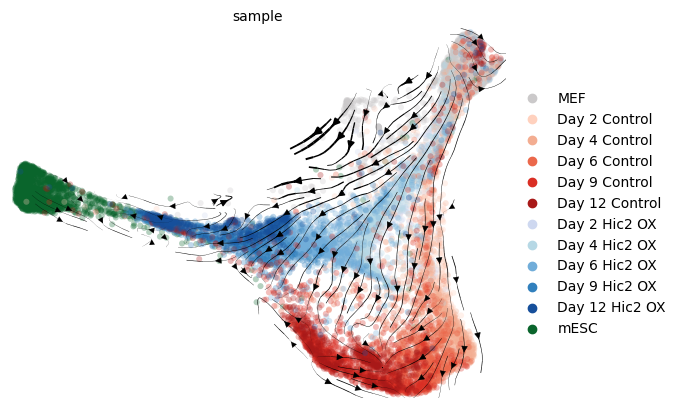

In [9]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

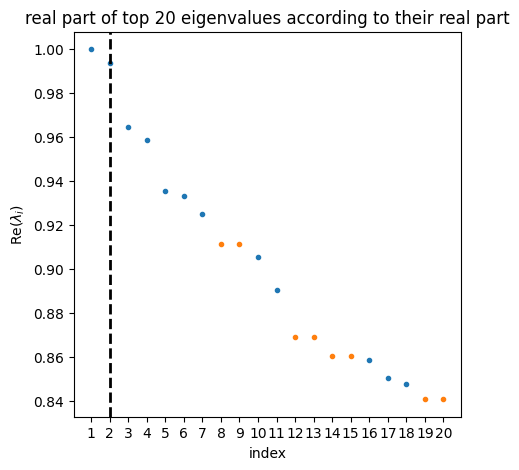

In [10]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

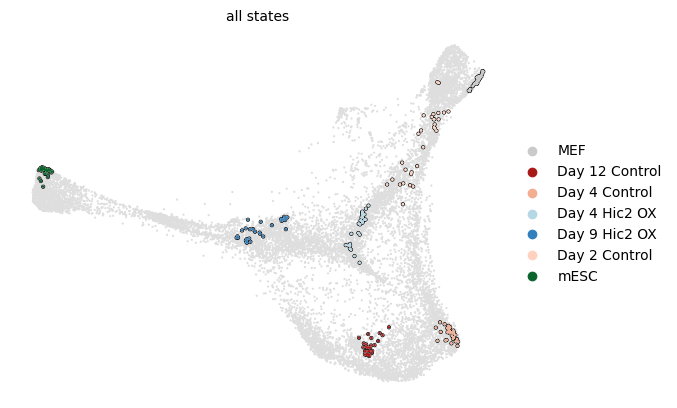

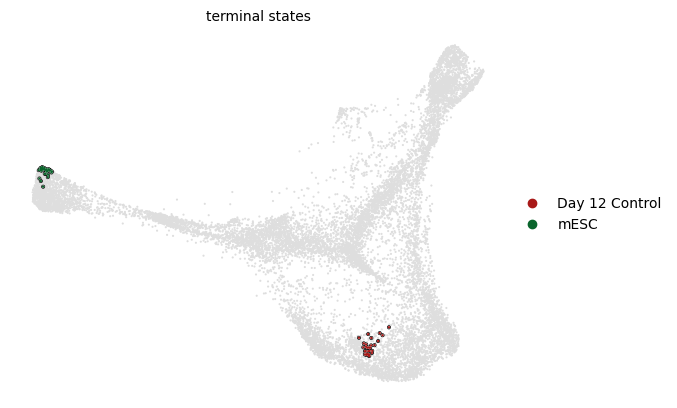

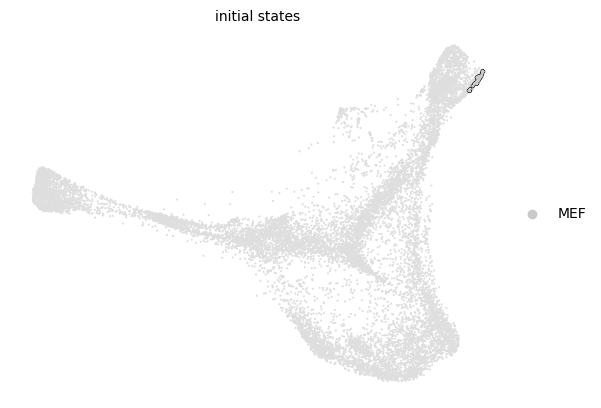

In [11]:
# Find 7 macrostates
estimator.compute_macrostates(n_states=7, cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

In [12]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
6            mESC   0.995677
1  Day 12 Control   0.977364
2   Day 4 Control   0.970570
4   Day 9 Hic2 OX   0.966667
3   Day 4 Hic2 OX   0.941652
0             MEF   0.932287
5   Day 2 Control   0.927347


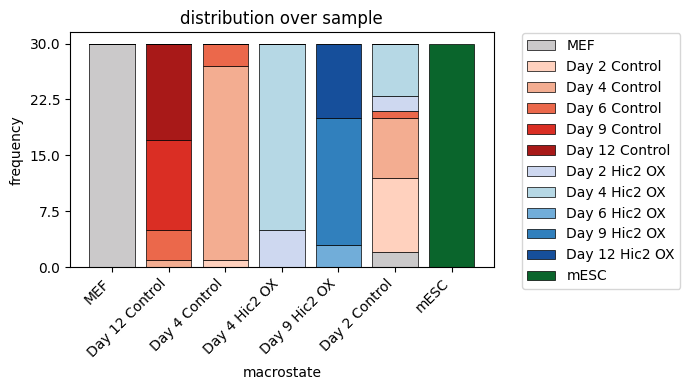

In [13]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

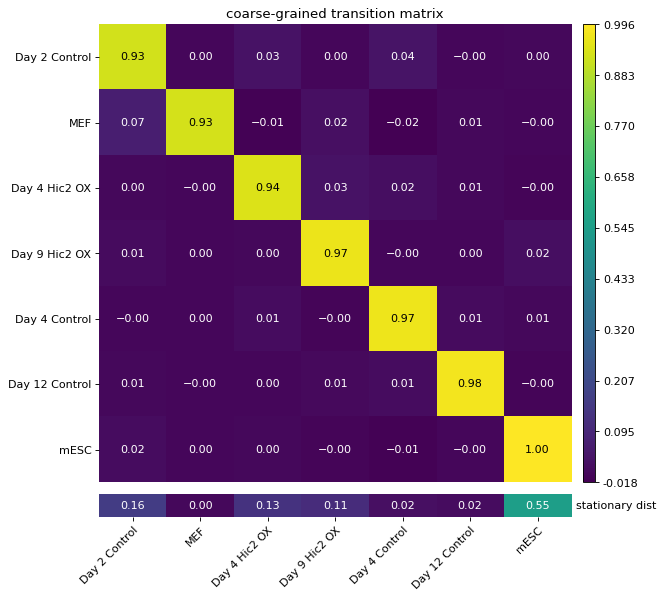

In [14]:
estimator.plot_coarse_T()

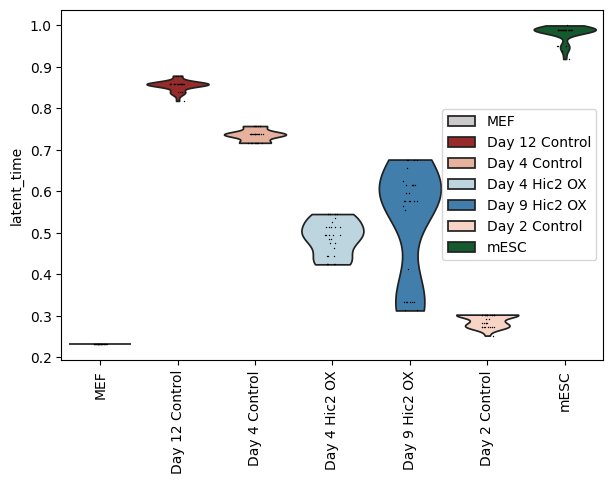

In [15]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

  0%|          | 0/2 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


  0%|          | 0/2 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


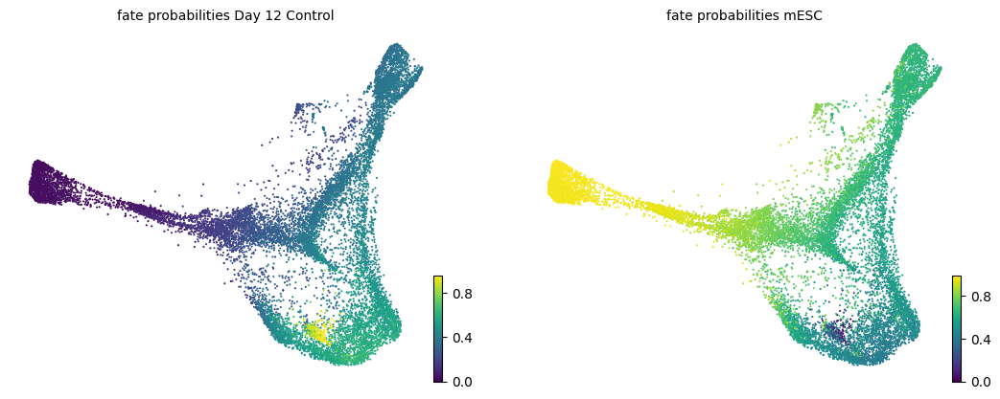

In [16]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

# Setup for plotting gene trends

In [17]:
# Function for plotting trends independent of trajectory

def plot_grouped_gene_trend(adata, genes, group_key="group", time_key="latent_time", layer="X", groups=None, columns=4, figure_width=14, plot_height=4, n_splines=6):
    """
    Plots smoothed gene expression using generalized additive models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].unique()
    if f"{group_key}_colors" in adata.uns_keys():
        palette = adata.uns[f"{group_key}_colors"]
        color_map = dict(zip(unique_groups, palette))
    else:
        palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
        color_map = dict(zip(unique_groups, palette))


    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        if layer == "raw":
            expr_data = adata.raw.to_adata()[:, gene].X
        elif layer == "X":
            expr_data = adata[:, gene].X
        else:
            expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups is None:
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and fit a GAM
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            color = color_map[group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y for pygam
            X = group_data["Latent Time"].values.reshape(-1, 1)
            y = group_data["Expression"].values
            
            # Fit LinearGAM using a spline term s(0)
            gam = pygam.LinearGAM(pygam.s(0, n_splines=n_splines)).fit(X, y)
            
            # Greate grid
            X_grid = numpy.linspace(X.min(), X.max(), 500)
            
            # Predict values and confidence intervals
            y_pred = gam.predict(X_grid)
            confidence_intervals = gam.confidence_intervals(X_grid, width=0.95)
            
            # Plot line
            axis.plot(X_grid, y_pred, label=group, color=color, linewidth=3)
            
            # Plot confidence interval
            axis.fill_between(
                X_grid, 
                confidence_intervals[:, 0], 
                confidence_intervals[:, 1], 
                color=color, 
                alpha=0.2
            )

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Latent Time")
        
        # Add legend to the first plot
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    pyplot.show()

# Define colors for all three groups

group_colors = [
    "#cbc9ca",
    "#0a652c",
    "#da2e24",
    "#3180bd",
]

adata.uns["group_colors"] = group_colors

control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

corr_column = terminal_states[-1]+"_corr"

# Drivers in all control and Hic2 cells

In [18]:
reprogramming_groups = ["Hic2", "control"]

# Find driver genes for all terminal states
driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)

In [19]:
# Drivers for dead end
driver_df.sort_values(corr_column, ascending=True).head(30)[[corr_column]]

,mESC_corr
gene_names,
Cd24a,-0.666674
Lmo1,-0.592961
Crip2,-0.576541
Lgals7,-0.573918
Ctsz,-0.573331
Rtn4r,-0.573231
Tmem238,-0.535299
Pcolce2,-0.527726
S100a16,-0.524546


In [20]:
# Drivers for mESCs
driver_df.sort_values(corr_column, ascending=False).head(30)[[corr_column]]

,mESC_corr
gene_names,
Rbpms2,0.597211
Mdk,0.591608
Fbxo15,0.584751
Folr1,0.579197
Utf1,0.572771
Apoc1,0.560520
Gdf3,0.558978
Klhl13,0.557740
Dnmt3l,0.555469


In [21]:
# How genes of interest correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3", "Hic2", "Sall4", "Shisa8", "Myc", "Cdkn1a"]

driver_df.loc[genes_of_interest][[corr_column]]

,mESC_corr
gene_names,
Krtdap,-0.102070
Krt8,-0.439456
Krt14,-0.344319
Nanog,0.304427
Tet1,0.478715
Cdh1,-0.311526
Ovol1,-0.445423
Atf3,-0.342312
Hic2,0.184487


In [22]:
# How stem cell drivers correlate with fate probability

stem_cell_tfs = ['Jarid2', 'Klf2', 'Mycn', 'Rest', 'Sall1', 'Tcf7l1', 'Tcf7l2',
       'Tfcp2l1', 'Tsc22d1', 'Zfp42']

driver_df.loc[stem_cell_tfs][[corr_column]].sort_values(corr_column, ascending=False)

,mESC_corr
gene_names,
Jarid2,0.501354
Zfp42,0.463805
Tcf7l1,0.431038
Rest,0.383292
Klf2,0.364567
Mycn,0.327301
Sall1,0.302645
Tfcp2l1,0.301141
Tsc22d1,0.290925


In [23]:
# How dead end drivers correlate with fate probability

dead_end_tfs = ['Barx2', 'Dmrtc2', 'Hmgb3', 'Hoxa7', 'Myc', 'Ovol1', 'Phox2a',
       'Tlx2', 'Tshz1', 'Zbtb7c']

driver_df.loc[dead_end_tfs][[corr_column]].sort_values(corr_column)

,mESC_corr
gene_names,
Tlx2,-0.480199
Ovol1,-0.445423
Dmrtc2,-0.443898
Zbtb7c,-0.356446
Myc,-0.350729
Phox2a,-0.309992
Hmgb3,-0.253110
Tshz1,-0.221095
Barx2,-0.218176


## Trends for identified control drivers

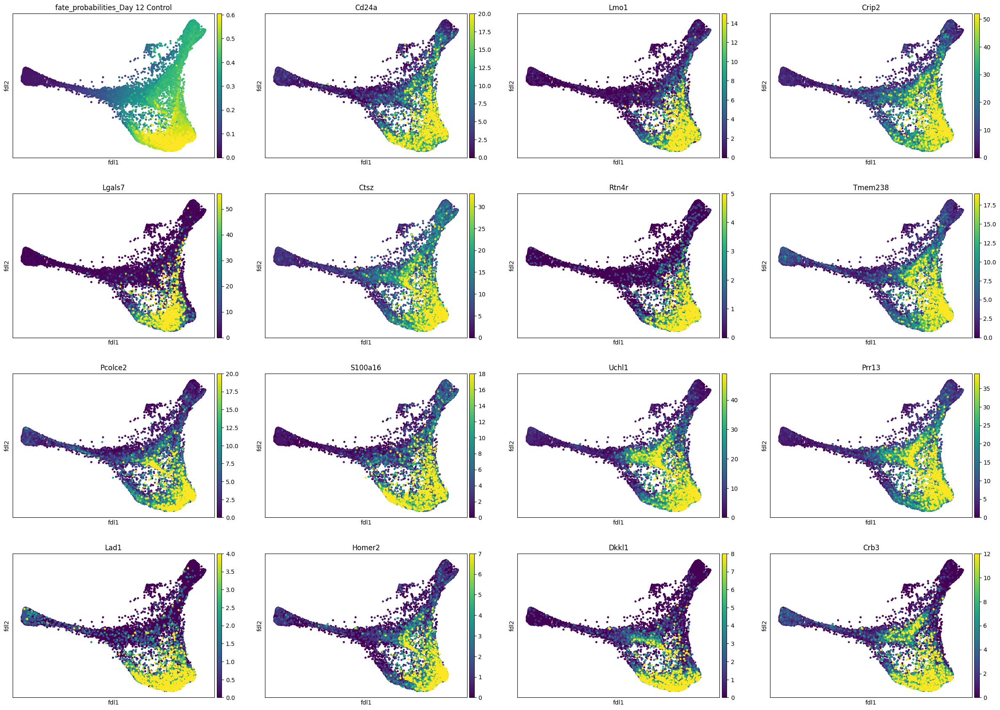

In [24]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

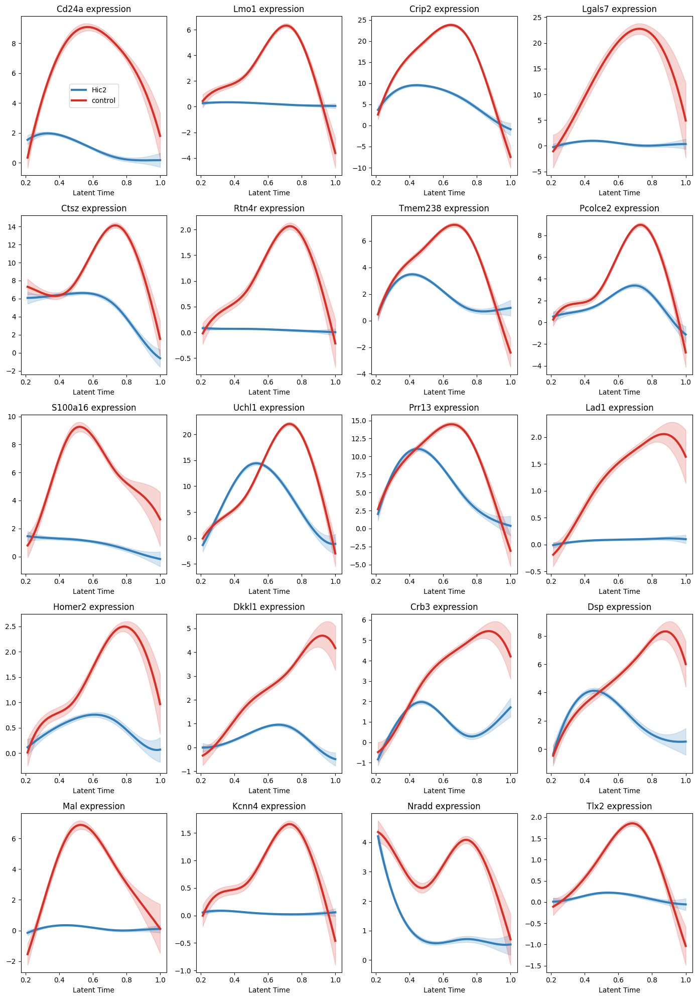

In [25]:
# Expression of drivers
dead_end_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    dead_end_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


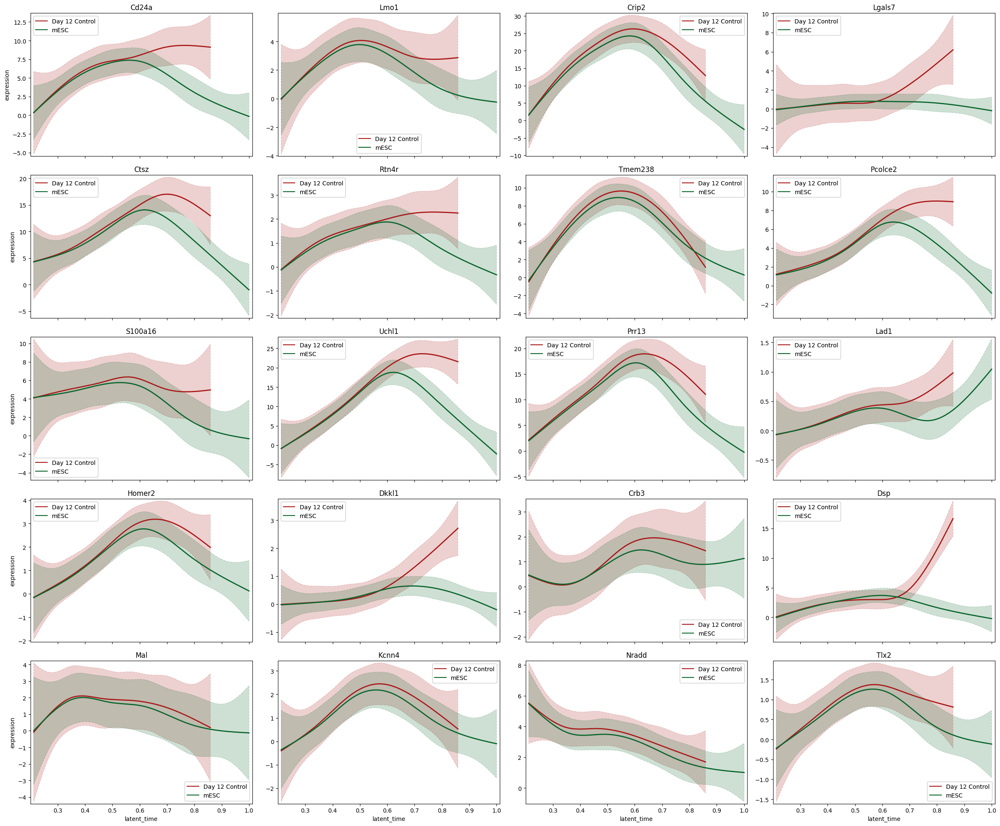

In [26]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


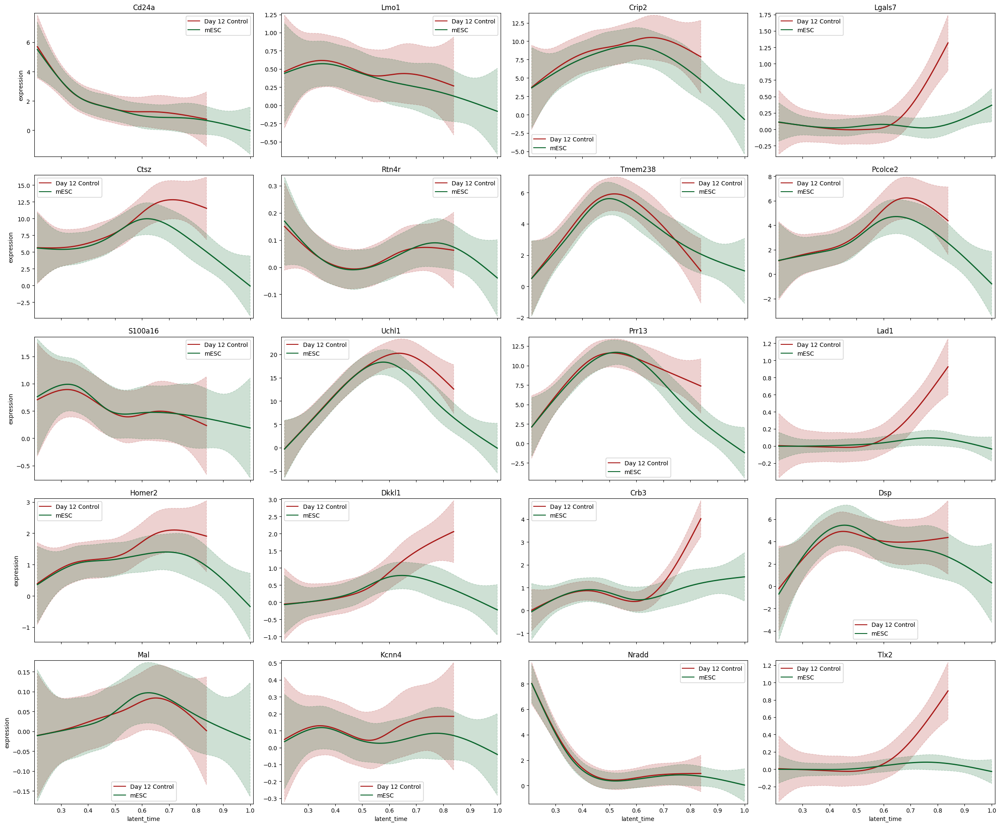

In [27]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


## Trends for identified reprogramming drivers

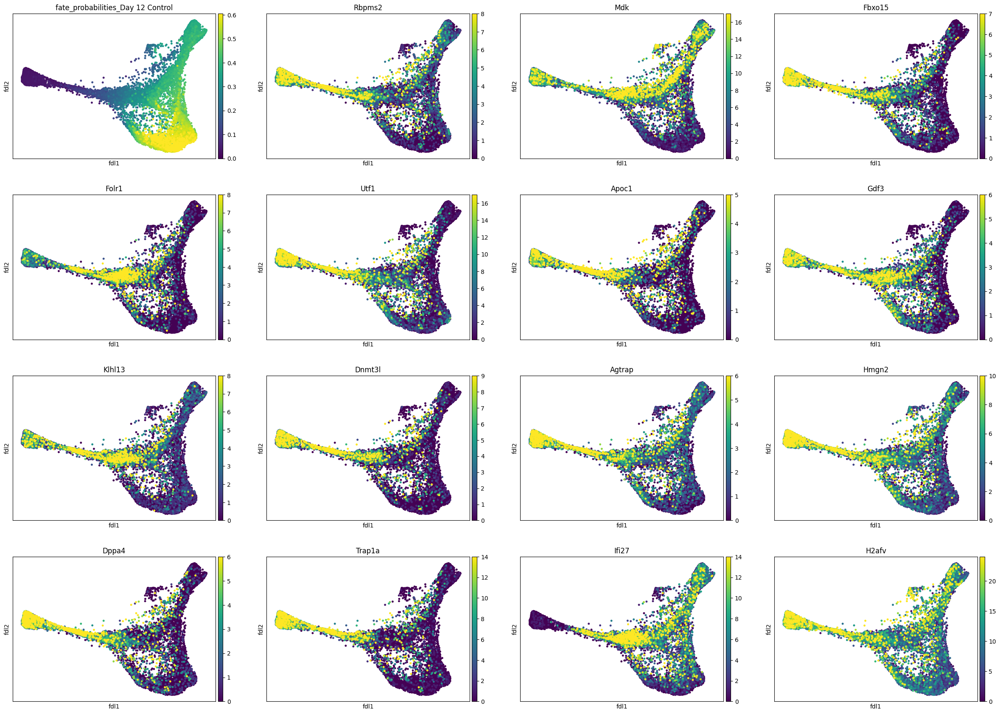

In [28]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

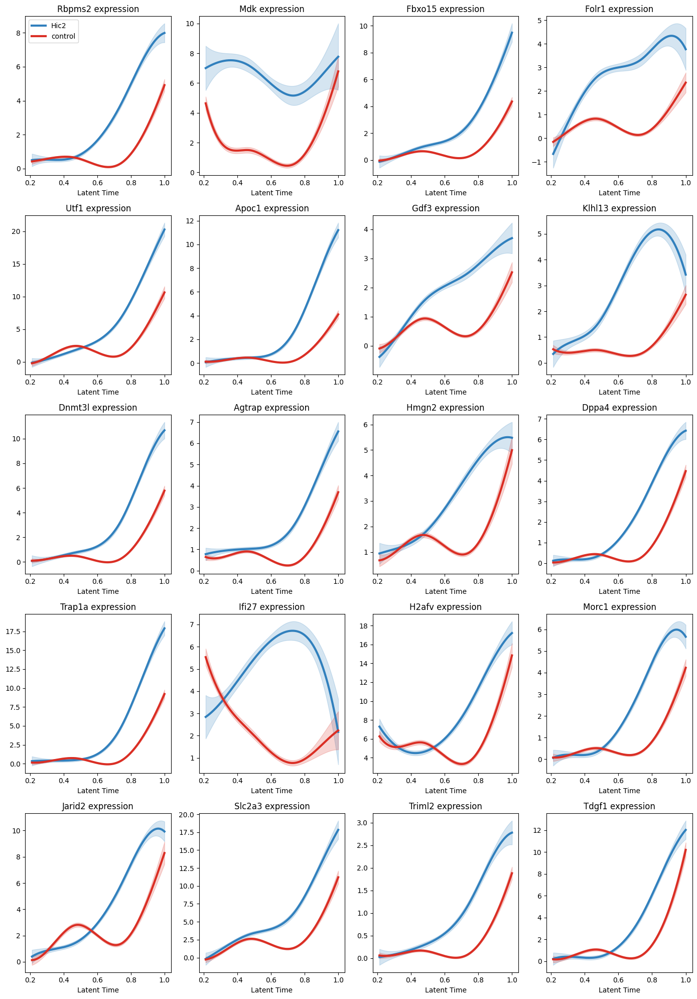

In [29]:
# Expression of drivers
stem_cell_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=True).head(20).index

plot_grouped_gene_trend(
    adata, 
    stem_cell_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

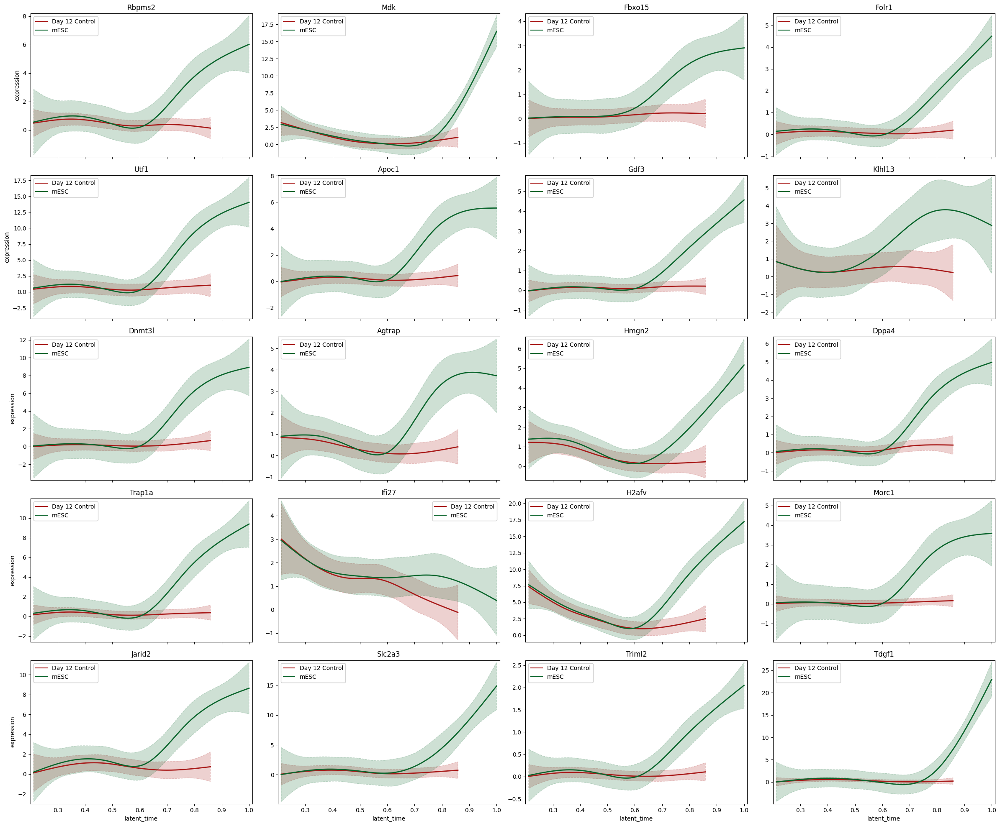

In [30]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


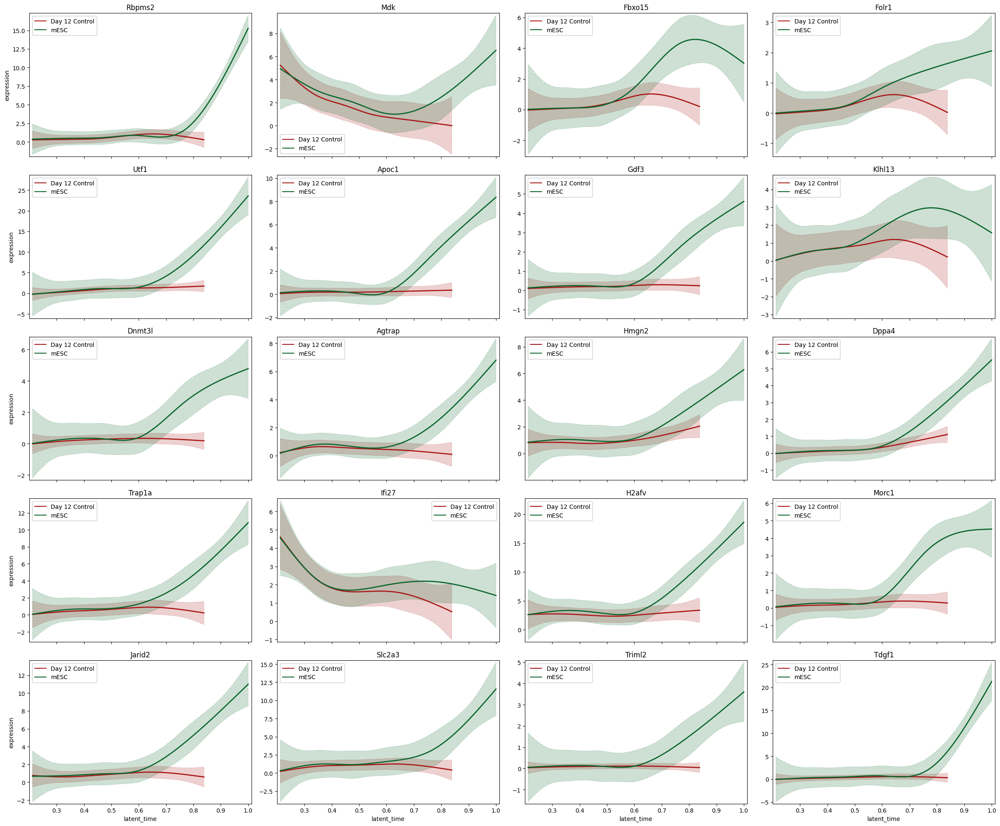

In [31]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

# Early drivers

In [32]:
latent_time_cutoff = 0.7

reprogramming_groups = ["Hic2", "control"]
control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"

# Create a variable for early cells
early_array = numpy.full(adata.shape[0], "Late", dtype=object)
early_array[adata.obs["group"].isin(reprogramming_groups) & (adata.obs["latent_time"] < latent_time_cutoff)] = "Early"
adata.obs["early_or_late"] = pandas.Series(early_array, index=adata.obs.index).astype("category")

In [33]:
# Find driver genes for all terminal states

early_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Early"
)

In [34]:
# Dead end drivers
combined_df = early_driver_df[[corr_column]].rename(columns={corr_column: "Early correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Early correlation", ascending=True).head(30)

,Early correlation,Full correlation
gene_names,,
Cd24a,-0.659636,-0.666674
Lmo1,-0.593162,-0.592961
Tmem238,-0.562001,-0.535299
Mal,-0.550059,-0.486937
Lgals7,-0.537740,-0.573918
Rtn4r,-0.534871,-0.573231
S100a16,-0.517547,-0.524546
Crip2,-0.504614,-0.576541
Tlx2,-0.495624,-0.480199


In [35]:
# Stem cell drivers
combined_df.sort_values("Early correlation", ascending=False).head(30)

,Early correlation,Full correlation
gene_names,,
Mdk,0.605457,0.591608
Folr1,0.603696,0.579197
Car2,0.558019,0.475880
Klhl13,0.538049,0.557740
Gdf3,0.530672,0.558978
Fgfbp1,0.528510,0.485555
Fbxo15,0.520916,0.584751
Ifi27,0.515796,0.528517
Hmgn2,0.492415,0.547770


In [36]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Early correlation")

,Early correlation,Full correlation
gene_names,,
Tlx2,-0.495624,-0.480199
Dmrtc2,-0.417111,-0.443898
Ovol1,-0.387631,-0.445423
Hmgb3,-0.288482,-0.253110
Zbtb7c,-0.274470,-0.356446
Phox2a,-0.247424,-0.309992
Myc,-0.208416,-0.350729
Tshz1,-0.196377,-0.221095
Hoxa7,-0.193743,-0.215433


# Late drivers

In [37]:
# Find driver genes for all terminal states

late_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Late"
)

In [38]:
# Dead end drivers
combined_df = late_driver_df[[corr_column]].rename(columns={corr_column: "Late correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Late correlation", ascending=True).head(30)

,Late correlation,Full correlation
gene_names,,
B2m,-0.778429,-0.436303
Ctsz,-0.743513,-0.573331
Prr13,-0.738511,-0.511853
Pcolce,-0.723722,-0.382948
H2-D1,-0.721875,-0.248414
Krt8,-0.716974,-0.439456
Cd24a,-0.712085,-0.666674
Gsto1,-0.696018,-0.468563
Emp3,-0.692895,-0.357130


In [39]:
combined_df.sort_values("Late correlation", ascending=False).head(30)

,Late correlation,Full correlation
gene_names,,
Dppa5a,0.828832,0.484882
Tdgf1,0.787209,0.490261
Ifitm1,0.785401,0.391551
Trap1a,0.774710,0.536222
Klf2,0.755020,0.364567
Tet1,0.753419,0.478715
H2afv,0.753389,0.524338
Zfp42,0.753364,0.463805
Utf1,0.736921,0.572771


In [40]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Late correlation")

,Late correlation,Full correlation
gene_names,,
Myc,-0.562034,-0.350729
Tlx2,-0.554835,-0.480199
Dmrtc2,-0.526430,-0.443898
Zbtb7c,-0.524198,-0.356446
Ovol1,-0.508904,-0.445423
Phox2a,-0.393053,-0.309992
Hoxa7,-0.337738,-0.215433
Tshz1,-0.325847,-0.221095
Barx2,-0.308157,-0.218176


# Drivers in control group only

In [41]:
# Find driver genes for all terminal states

control_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="control"
)

In [42]:
# Dead end drivers
combined_df = control_driver_df[[corr_column]].rename(columns={corr_column: "Control correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Control correlation", ascending=True).head(30)

,Control correlation,Full correlation
gene_names,,
Uchl1,-0.567610,-0.521084
Ctsz,-0.511894,-0.573331
Crb3,-0.495577,-0.489375
Dsp,-0.484760,-0.488252
Shisa8,-0.479142,-0.450232
Ifi30,-0.469231,-0.468060
Dkkl1,-0.468242,-0.500460
Krt8,-0.457780,-0.439456
Perp,-0.454902,-0.458657


In [43]:
# Stem cell drivers
combined_df.sort_values("Control correlation", ascending=False).head(30)

,Control correlation,Full correlation
gene_names,,
Dppa5a,0.558010,0.484882
Rbpms2,0.543777,0.597211
Fn1,0.542298,0.424694
Sparc,0.539404,0.461158
Apoc1,0.526927,0.560520
Tdgf1,0.523625,0.490261
Trap1a,0.520156,0.536222
Agtrap,0.509990,0.554774
Utf1,0.509698,0.572771


In [44]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Control correlation")

,Control correlation,Full correlation
gene_names,,
Ovol1,-0.365192,-0.445423
Dmrtc2,-0.339314,-0.443898
Tlx2,-0.335959,-0.480199
Myc,-0.311913,-0.350729
Zbtb7c,-0.264435,-0.356446
Phox2a,-0.261776,-0.309992
Barx2,-0.173551,-0.218176
Hoxa7,-0.070745,-0.215433
Hmgb3,-0.038780,-0.253110


# Drivers in Hic2 only

In [45]:
# Find driver genes for all terminal states

hic2_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="Hic2"
)

In [46]:
# Dead end drivers
combined_df = hic2_driver_df[[corr_column]].rename(columns={corr_column: "Hic2 correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Hic2 correlation", ascending=True).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Anxa5,-0.708806,-0.298318
Lmna,-0.691959,-0.377556
B2m,-0.691094,-0.436303
Ccnd2,-0.676662,-0.470690
S100a6,-0.651445,-0.108858
Abracl,-0.651259,-0.167160
Emp3,-0.645743,-0.357130
Esd,-0.641539,-0.256785
Vim,-0.639121,0.220655


In [47]:
# Stem cell drivers
combined_df.sort_values("Hic2 correlation", ascending=False).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Zfp42,0.683763,0.463805
Utf1,0.674531,0.572771
Fbxo15,0.673378,0.584751
Apoc1,0.669694,0.560520
Dppa4,0.664663,0.543490
Jarid2,0.658674,0.501354
Dnmt3l,0.654055,0.555469
Trap1a,0.647634,0.536222
Rbpms2,0.646552,0.597211


In [48]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Hic2 correlation")

,Hic2 correlation,Full correlation
gene_names,,
Tshz1,-0.398554,-0.221095
Hoxa7,-0.272869,-0.215433
Myc,-0.257370,-0.350729
Phox2a,-0.171176,-0.309992
Tlx2,-0.163531,-0.480199
Hmgb3,-0.145666,-0.253110
Zbtb7c,-0.140390,-0.356446
Ovol1,-0.098530,-0.445423
Dmrtc2,-0.054950,-0.443898


# Compare correlations in different groups

In [49]:
# Dead end drivers
combined_df = driver_df[[corr_column]].rename(columns={corr_column: "Full correlation"})
combined_df["Early correlation"] = early_driver_df[[corr_column]]
combined_df["Late correlation"] = late_driver_df[[corr_column]]
combined_df["Control correlation"] = control_driver_df[[corr_column]]
combined_df["Hic2 correlation"] = hic2_driver_df[[corr_column]]
combined_df.sort_values("Full correlation", ascending=True).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Cd24a,-0.666674,-0.659636,-0.712085,-0.449153,-0.421332
Lmo1,-0.592961,-0.593162,-0.656524,-0.401920,-0.232262
Crip2,-0.576541,-0.504614,-0.647914,-0.391731,-0.444398
Lgals7,-0.573918,-0.537740,-0.663353,-0.421940,-0.074738
Ctsz,-0.573331,-0.431359,-0.743513,-0.511894,-0.494104
Rtn4r,-0.573231,-0.534871,-0.640034,-0.435781,-0.165027
Tmem238,-0.535299,-0.562001,-0.470043,-0.327448,-0.524702
Pcolce2,-0.527726,-0.470709,-0.557664,-0.382491,-0.331954
S100a16,-0.524546,-0.517547,-0.683902,-0.284966,-0.226941


In [50]:
# Stem cell drivers
combined_df.sort_values("Full correlation", ascending=False).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Rbpms2,0.597211,0.478009,0.728778,0.543777,0.646552
Mdk,0.591608,0.605457,0.648311,0.471320,0.414443
Fbxo15,0.584751,0.520916,0.716017,0.483130,0.673378
Folr1,0.579197,0.603696,0.536319,0.435107,0.597620
Utf1,0.572771,0.491608,0.736921,0.509698,0.674531
Apoc1,0.560520,0.457258,0.603066,0.526927,0.669694
Gdf3,0.558978,0.530672,0.662617,0.469252,0.596944
Klhl13,0.557740,0.538049,0.466377,0.383636,0.564498
Dnmt3l,0.555469,0.465107,0.676663,0.490360,0.654055


# Expression trends for drivers identified with ChipSeq

In [51]:
# How ChipSeq target TFs correlate with fate probability in different groups

combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Full correlation")

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Tlx2,-0.480199,-0.495624,-0.554835,-0.335959,-0.163531
Ovol1,-0.445423,-0.387631,-0.508904,-0.365192,-0.098530
Dmrtc2,-0.443898,-0.417111,-0.526430,-0.339314,-0.054950
Zbtb7c,-0.356446,-0.274470,-0.524198,-0.264435,-0.140390
Myc,-0.350729,-0.208416,-0.562034,-0.311913,-0.257370
Phox2a,-0.309992,-0.247424,-0.393053,-0.261776,-0.171176
Hmgb3,-0.253110,-0.288482,-0.227479,-0.038780,-0.145666
Tshz1,-0.221095,-0.196377,-0.325847,-0.013013,-0.398554
Barx2,-0.218176,-0.172298,-0.308157,-0.173551,0.028083


## Dead end drivers

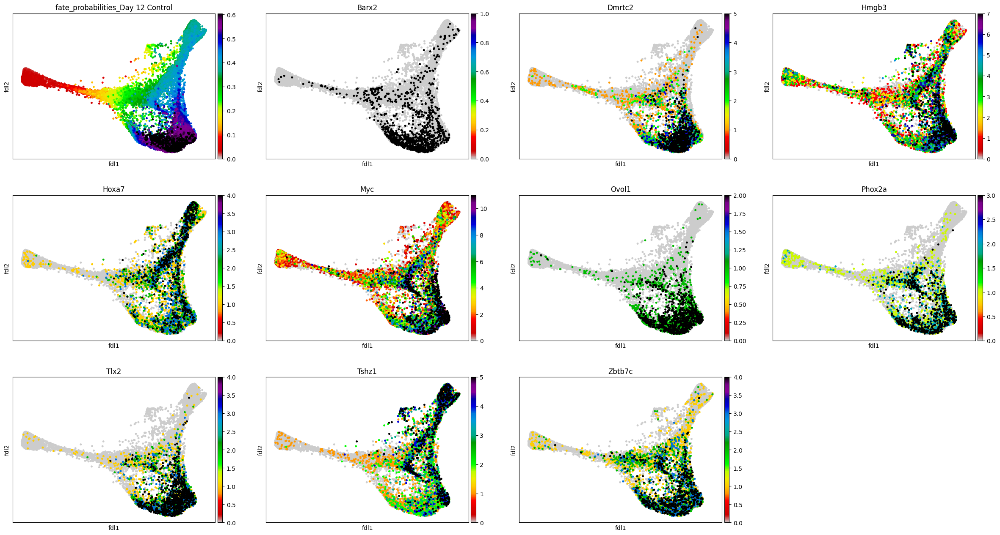

In [52]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + dead_end_tfs,
    color_map="nipy_spectral_r",
    s=50,
    ncols=4,
    vmax="p96",
)

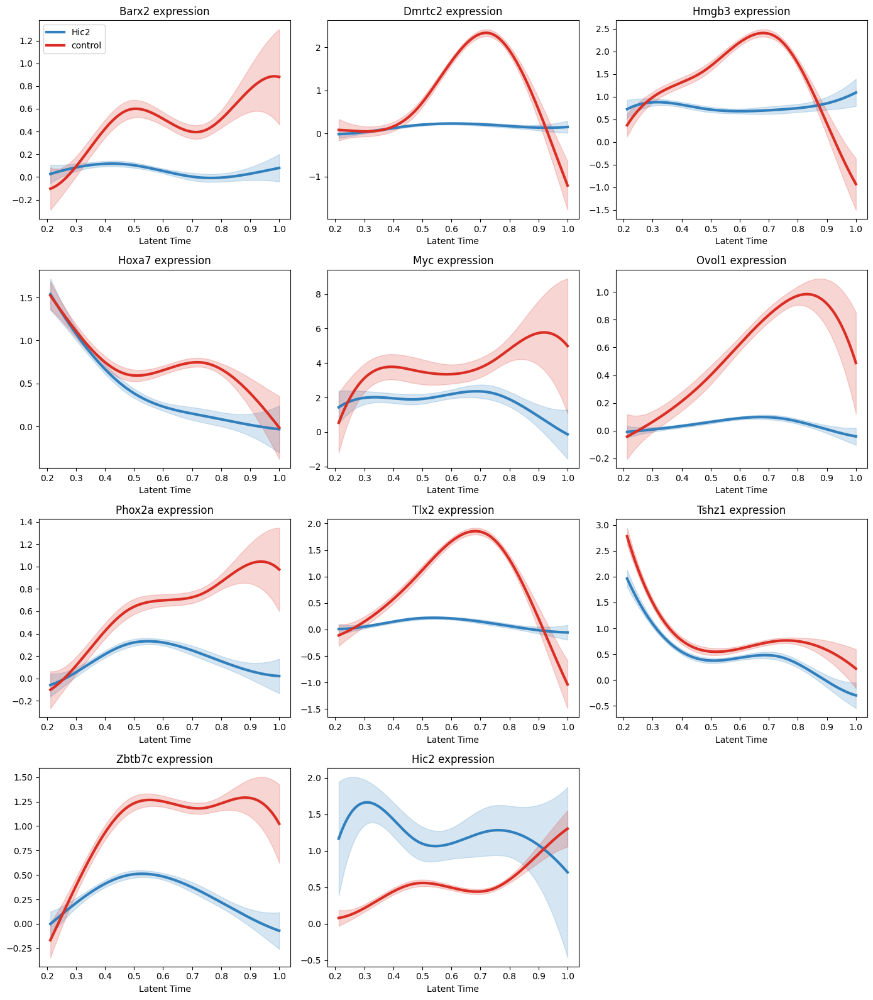

In [53]:
# Expression of dead end drivers

plot_grouped_gene_trend(
    adata,
    dead_end_tfs+["Hic2"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/10 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


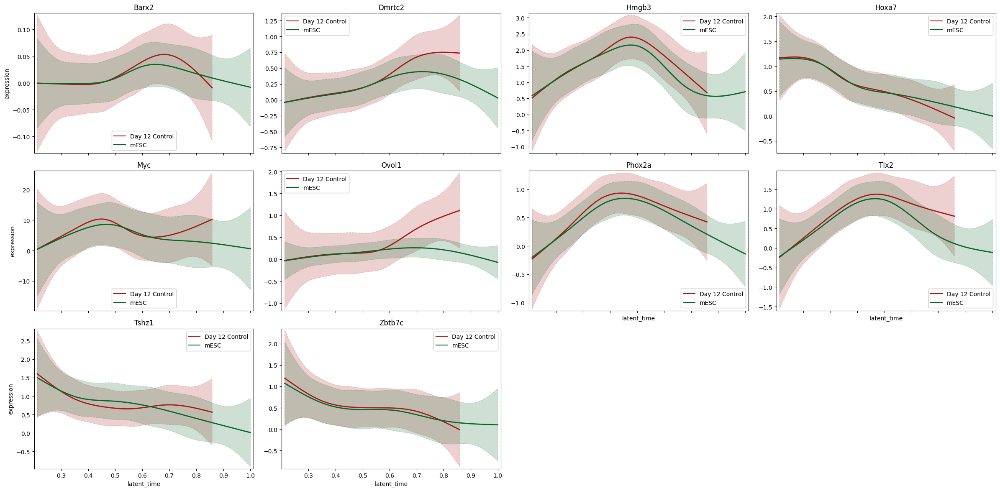

In [54]:
# Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


Ovol1 has the clearest correlation with the dead end, but Tlx2, Dmtrc2 and Myc are also interesting.

  0%|          | 0/10 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


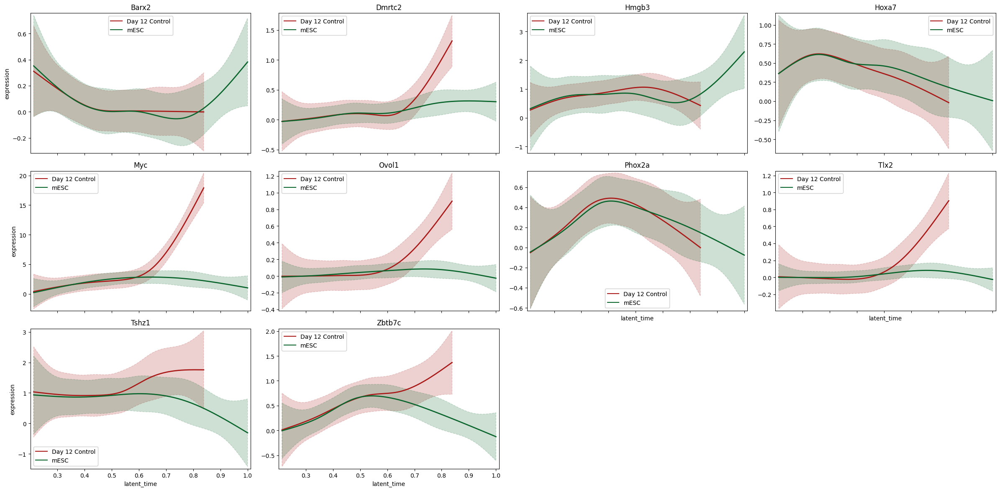

In [55]:
# Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


With only Hic2 OX cells, it is clearer that cells ending up in the dead end have high Dmtrc2, Myc, Ovol1, Tlx2, Tshz1 and Zbtb7. Dmtrc2, Ovol1 and Tlx2 have patterns typical of targets in the group comparison. The three most interesting targets are Dmtrc2, Ovol1 and Tlx2.

## Stem cell drivers

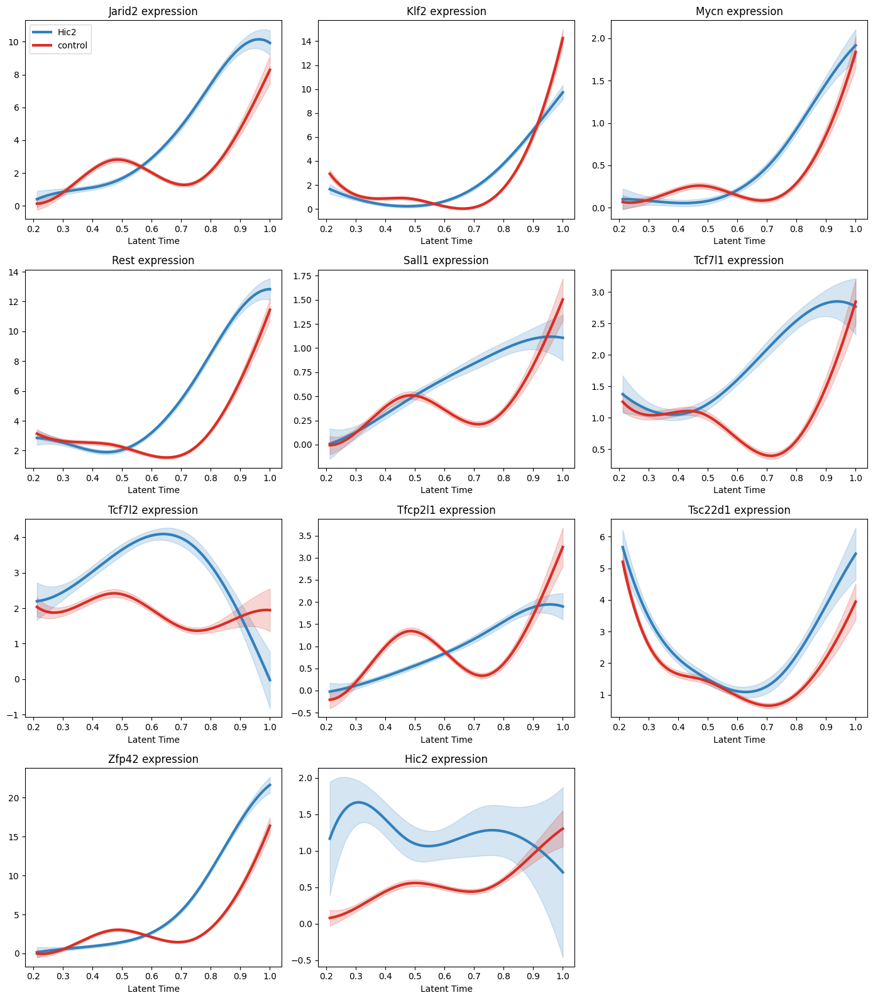

In [56]:
# Expression of reprogramming drivers

plot_grouped_gene_trend(
    adata,
    stem_cell_tfs+["Hic2"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/10 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


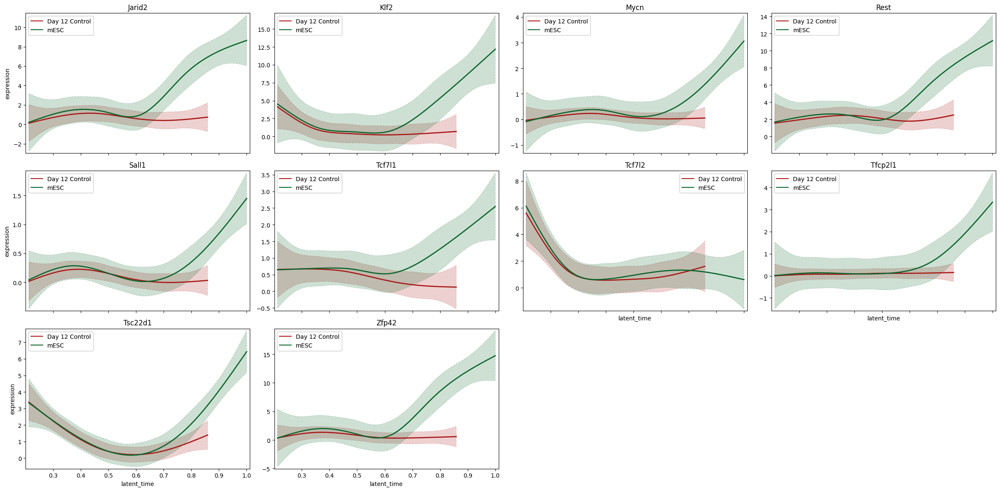

In [57]:
# Trends separated by trajectory, Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/10 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


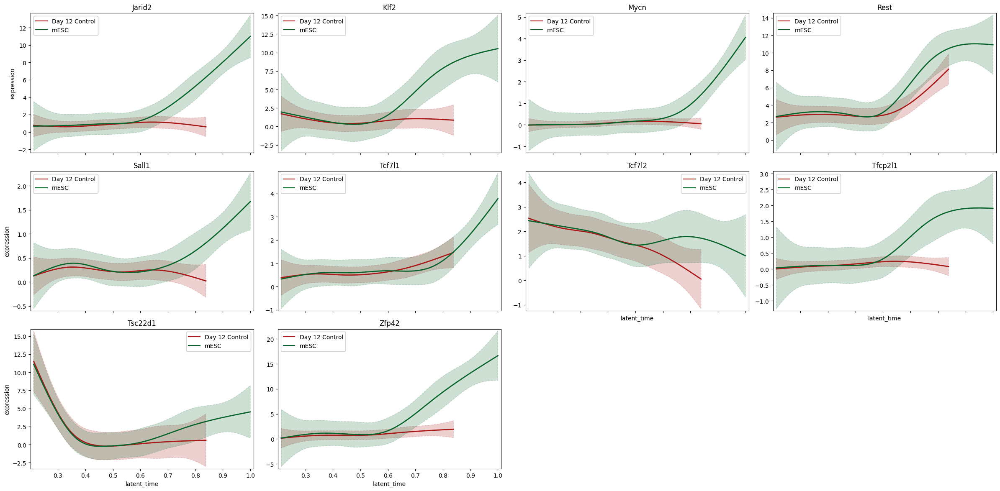

In [58]:
# Trends separated by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


# Trends for genes of interest

In [61]:
genes_of_interest = ["Klf4", "Myc", "Hic2", "Ovol1", "Atf3", "Maff", "Crebrf", "Zbtb10", "Junb", "Arid3a", "Klf6", "Klf4", "Klf10"]

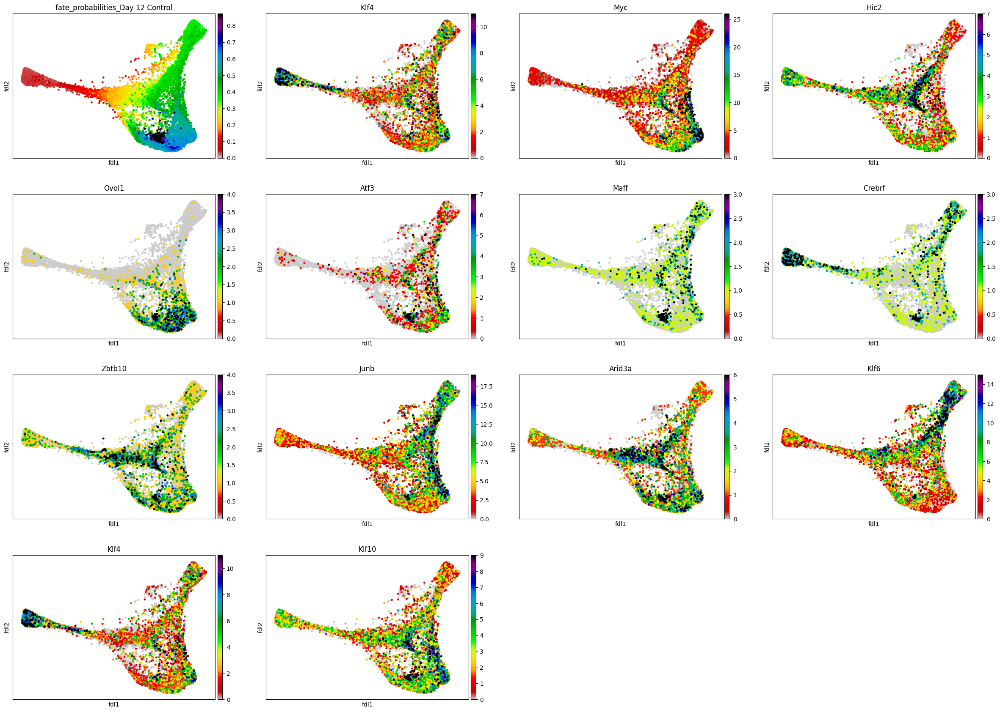

In [67]:
# Visualize genes of interest

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + genes_of_interest,
    color_map="nipy_spectral_r",
    s=50,
    ncols=4,
    vmax="p99",
)

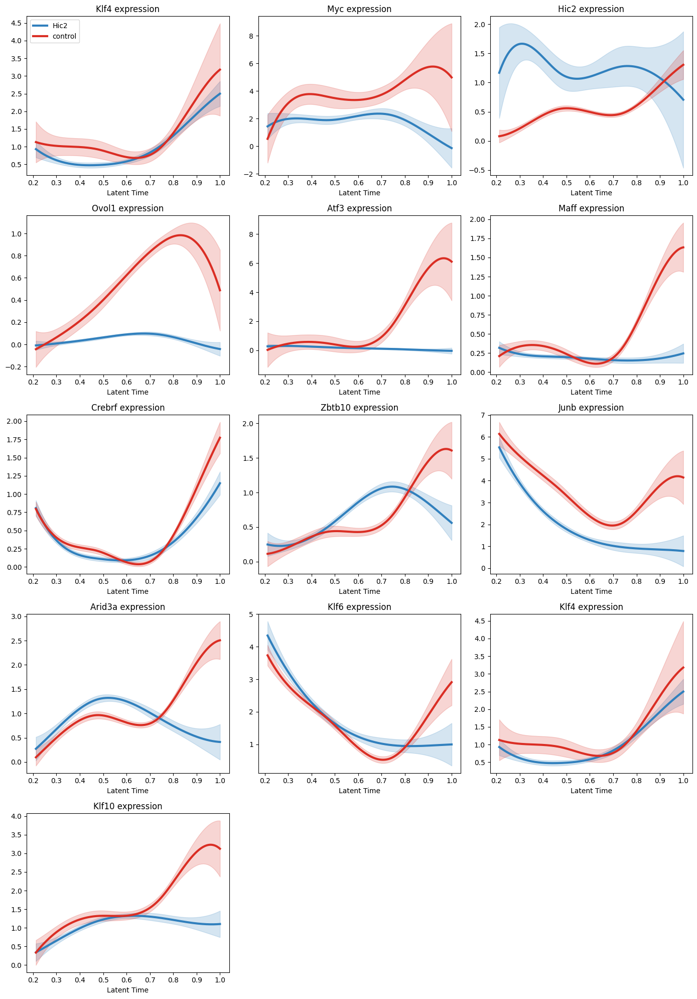

In [68]:
plot_grouped_gene_trend(
    adata,
    genes_of_interest,
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/12 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


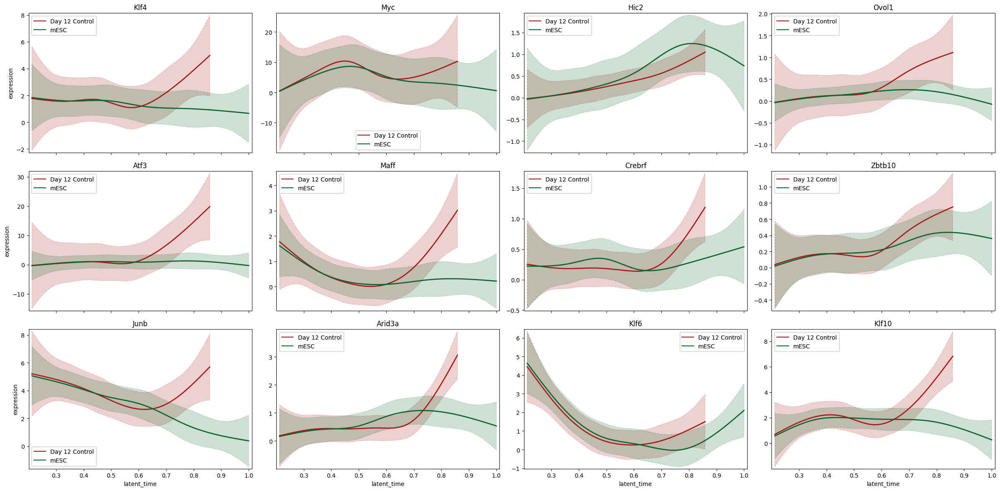

In [69]:
# Trends separated by trajectory, Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/12 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


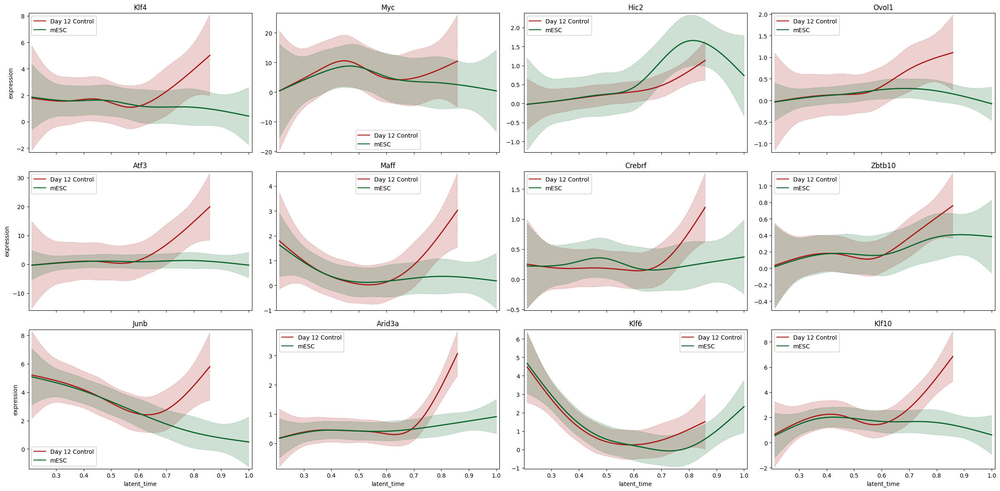

In [73]:
# Trends separated by trajectory, control only

model = cellrank.models.GAMR(adata[control_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[control_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/12 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


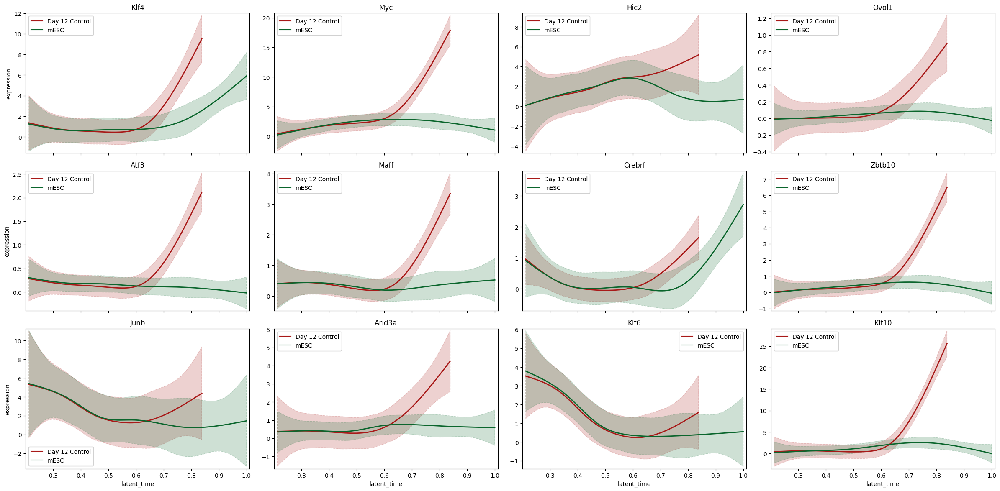

In [71]:
# Trends separated by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=genes_of_interest,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


# Save results

In [59]:
# Save results

base_name = "cellrank_version_5"

adata.write_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes.csv",
)

early_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_early.csv",
)

late_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_late.csv",
)

control_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_control.csv",
)

hic2_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_hic2.csv",
)

combined_df.to_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
)